# **PSF-Aware Image Deblurring with CBAM-Infused Deep Residual Networks**

### Import Required Libraries

In [1]:
!pip install pytorch-msssim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.0 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.9.90
    Uninstalling nvidia-curand-cu12-1

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torchvision.models as models
import pytorch_msssim
from torchsummary import summary
import torchmetrics




In [ ]:
DATA_PATH = "/kaggle/input/bmvc-ocr/BMVC_OCR_test_data  "
BATCH_SIZE = 8
IMG_SIZE = (224, 224)
NUM_EPOCHS = 30
LEARNING_RATE = 0.001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


### Custom Dataset Class for Document Deblurring


In [4]:
class DocumentDataset(Dataset):
    def __init__(self, root_dir, transform_rgb=None, transform_psf=None):
        self.root_dir = root_dir
        self.transform_rgb = transform_rgb
        self.transform_psf = transform_psf
        self.image_pairs = []

        noisy_dirs = [d for d in os.listdir(root_dir) if d.startswith("n_")]
        orig_folder = os.path.join(root_dir, "orig")
        psf_folder = os.path.join(root_dir, "psf")

        for noisy_dir in noisy_dirs:
            noisy_path = os.path.join(root_dir, noisy_dir)
            for img_name in os.listdir(noisy_path):
                if not img_name.endswith("_blur.png"):
                    continue
                base_name = img_name.replace("_blur.png", "")
                noisy_img_path = os.path.join(noisy_path, img_name)
                clean_img_path = os.path.join(orig_folder, f"{base_name}_orig.png")
                psf_img_path = os.path.join(psf_folder, f"{base_name}_psf.png")

                if os.path.exists(clean_img_path) and os.path.exists(psf_img_path):
                    self.image_pairs.append((noisy_img_path, clean_img_path, psf_img_path))

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        noisy_path, clean_path, psf_path = self.image_pairs[idx]
        noisy_img = Image.open(noisy_path).convert("RGB")
        clean_img = Image.open(clean_path).convert("RGB")
        psf_img = Image.open(psf_path).convert("L")

        if self.transform_rgb:
            noisy_img = self.transform_rgb(noisy_img)
            clean_img = self.transform_rgb(clean_img)
        if self.transform_psf:
            psf_img = self.transform_psf(psf_img)

        return noisy_img, clean_img, psf_img

In [5]:
transform_rgb = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3) 
])

transform_psf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(), 
])



### Define Image Transformations

#### Train-Validation Split & DataLoader Setup

In [6]:
full_dataset = DocumentDataset(DATA_PATH, transform_rgb, transform_psf)
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
print(f"Train: {len(train_dataset)} | Val: {len(val_dataset)}")

Train: 827 | Val: 207


### **Model Architecture — DeepDeBlurCNN with Residual & CBAM Blocks**

#### **Channel Attention**

1. **Squeezing:**  
   The input feature map is squeezed along the spatial dimensions (height and width) to obtain a compact channel representation.

2. **Excitation:**  
   A small neural network (typically an MLP) learns channel-wise attention weights from the squeezed representation.

3. **Scaling:**  
   The learned attention weights are applied to the original feature map, emphasizing important channels and suppressing less relevant ones.

4. **Aggregation:**  
   The enhanced feature map is forwarded to subsequent layers for further processing.


In [7]:
import torch.nn.functional as F

class CBAMBlock(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.channel_att = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channels, channels // reduction, 1),
            nn.ReLU(),
            nn.Conv2d(channels // reduction, channels, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        att = self.channel_att(x)
        return x * att

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels)
        )
        self.relu = nn.ReLU(inplace=True)
        self.skip = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x):
        skip = self.skip(x)
        x = self.conv_block(x)
        return self.relu(x + skip)

class DeepDeBlurCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(4, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )

        self.encoder = nn.Sequential(
            ResidualBlock(64, 128),
            CBAMBlock(128),
            ResidualBlock(128, 256),
            CBAMBlock(256),
            ResidualBlock(256, 512),
            CBAMBlock(512),
        )

        self.decoder = nn.Sequential(
            ResidualBlock(512, 256),
            ResidualBlock(256, 128),
            ResidualBlock(128, 64),
            nn.Conv2d(64, 3, kernel_size=3, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.initial(x)
        x = self.encoder(x)
        x = self.decoder(x)
        return x

### Model Summary — DeepDeBlurCNN Structure Overview

In [8]:

model = DeepDeBlurCNN().to(device)
summary(model, (4, *IMG_SIZE))  # (C,H,W) with 4 channels: 3 RGB + 1 PSF


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           2,368
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4        [-1, 128, 224, 224]           8,320
            Conv2d-5        [-1, 128, 224, 224]          73,856
       BatchNorm2d-6        [-1, 128, 224, 224]             256
              ReLU-7        [-1, 128, 224, 224]               0
            Conv2d-8        [-1, 128, 224, 224]         147,584
       BatchNorm2d-9        [-1, 128, 224, 224]             256
             ReLU-10        [-1, 128, 224, 224]               0
    ResidualBlock-11        [-1, 128, 224, 224]               0
AdaptiveAvgPool2d-12            [-1, 128, 1, 1]               0
           Conv2d-13              [-1, 8, 1, 1]           1,032
             ReLU-14              [-1, 

In [9]:
!pip install torchmetrics
from torchmetrics.image import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure
from torch.optim.lr_scheduler import CosineAnnealingLR

### Define Hybrid Loss Function & Optimizer

In [10]:
class HybridLoss(nn.Module):
    def __init__(self, mse_weight=0.6, ssim_weight=0.3, l1_weight=0.1):
        super().__init__()
        self.mse = nn.MSELoss()
        self.l1 = nn.L1Loss()
        self.ssim = pytorch_msssim.SSIM(data_range=1.0, size_average=True, channel=3)

        self.mse_weight = mse_weight
        self.ssim_weight = ssim_weight
        self.l1_weight = l1_weight

    def forward(self, output, target):
        loss = (
            self.mse_weight * self.mse(output, target) +
            self.ssim_weight * (1 - self.ssim(output, target)) +
            self.l1_weight * self.l1(output, target)
        )
        return loss   

criterion = HybridLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)

# Optional metrics
psnr_metric = torchmetrics.PeakSignalNoiseRatio().to(device)
ssim_metric = torchmetrics.StructuralSimilarityIndexMeasure().to(device)

/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `PeakSignalNoiseRatio` from `torchmetrics` was deprecated and will be removed in 2.0. Import `PeakSignalNoiseRatio` from `torchmetrics.image` instead.
  _future_warning(
/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


### Train the Model for 10 Epochs & Validate

In [11]:
import torch
from tqdm import tqdm


NUM_EPOCHS = 30
LEARNING_RATE = 0.001
SAVE_PATH = "deblur_cnn_epoch30.pth"

# Improved optimizer and scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)

best_val_loss = float("inf")
train_history = {"loss": [], "psnr": [], "ssim": []}
val_history = {"loss": [], "psnr": [], "ssim": []}

for epoch in range(NUM_EPOCHS):
    model.train()
    train_loss, train_psnr, train_ssim = 0, 0, 0

    for noisy, clean, psf in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Train]"):
        noisy, clean, psf = noisy.to(device), clean.to(device), psf.to(device)
        inputs = torch.cat([noisy, psf], dim=1)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, clean)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_psnr += psnr_metric(outputs, clean).item()
        train_ssim += ssim_metric(outputs, clean).item()

    scheduler.step()  # Update learning rate

    avg_train_loss = train_loss / len(train_loader)
    avg_train_psnr = train_psnr / len(train_loader)
    avg_train_ssim = train_ssim / len(train_loader)
    train_history["loss"].append(avg_train_loss)
    train_history["psnr"].append(avg_train_psnr)
    train_history["ssim"].append(avg_train_ssim)

    # Validation
    model.eval()
    val_loss, val_psnr, val_ssim = 0, 0, 0

    with torch.no_grad():
        for noisy, clean, psf in tqdm(val_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Val]"):
            noisy, clean, psf = noisy.to(device), clean.to(device), psf.to(device)
            inputs = torch.cat([noisy, psf], dim=1)

            outputs = model(inputs)
            loss = criterion(outputs, clean)

            val_loss += loss.item()
            val_psnr += psnr_metric(outputs, clean).item()
            val_ssim += ssim_metric(outputs, clean).item()

    avg_val_loss = val_loss / len(val_loader)
    avg_val_psnr = val_psnr / len(val_loader)
    avg_val_ssim = val_ssim / len(val_loader)
    val_history["loss"].append(avg_val_loss)
    val_history["psnr"].append(avg_val_psnr)
    val_history["ssim"].append(avg_val_ssim)

    print(f"\n Epoch [{epoch+1}/{NUM_EPOCHS}]")
    print(f"Train -> Loss: {avg_train_loss:.4f}, PSNR: {avg_train_psnr:.2f}, SSIM: {avg_train_ssim:.4f}")
    print(f"Val   -> Loss: {avg_val_loss:.4f}, PSNR: {avg_val_psnr:.2f}, SSIM: {avg_val_ssim:.4f}")

    # Save best model during training
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), SAVE_PATH)
        print("Best model updated!")

print(f"\nTraining completed for {NUM_EPOCHS} epochs.")


Epoch 1/30 [Val]: 100%|██████████| 26/26 [00:19<00:00,  1.36it/s]



 Epoch [1/30]
Train -> Loss: 0.0337, PSNR: 25.41, SSIM: 0.9416
Val   -> Loss: 0.0154, PSNR: 27.89, SSIM: 0.9718
Best model updated!


Epoch 2/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]



 Epoch [2/30]
Train -> Loss: 0.0150, PSNR: 28.02, SSIM: 0.9726
Val   -> Loss: 0.0163, PSNR: 27.68, SSIM: 0.9698


Epoch 3/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [3/30]
Train -> Loss: 0.0138, PSNR: 28.37, SSIM: 0.9749
Val   -> Loss: 0.0144, PSNR: 28.21, SSIM: 0.9740
Best model updated!


Epoch 4/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [4/30]
Train -> Loss: 0.0133, PSNR: 28.53, SSIM: 0.9759
Val   -> Loss: 0.0129, PSNR: 28.72, SSIM: 0.9767
Best model updated!


Epoch 5/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [5/30]
Train -> Loss: 0.0128, PSNR: 28.69, SSIM: 0.9768
Val   -> Loss: 0.0120, PSNR: 29.17, SSIM: 0.9783
Best model updated!


Epoch 6/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.58it/s]



 Epoch [6/30]
Train -> Loss: 0.0121, PSNR: 28.95, SSIM: 0.9783
Val   -> Loss: 0.0116, PSNR: 29.24, SSIM: 0.9792
Best model updated!


Epoch 7/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]



 Epoch [7/30]
Train -> Loss: 0.0119, PSNR: 28.99, SSIM: 0.9788
Val   -> Loss: 0.0112, PSNR: 29.41, SSIM: 0.9800
Best model updated!


Epoch 8/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]



 Epoch [8/30]
Train -> Loss: 0.0113, PSNR: 29.33, SSIM: 0.9799
Val   -> Loss: 0.0107, PSNR: 29.52, SSIM: 0.9811
Best model updated!


Epoch 9/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [9/30]
Train -> Loss: 0.0109, PSNR: 29.45, SSIM: 0.9807
Val   -> Loss: 0.0113, PSNR: 29.31, SSIM: 0.9798


Epoch 10/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [10/30]
Train -> Loss: 0.0103, PSNR: 29.65, SSIM: 0.9818
Val   -> Loss: 0.0098, PSNR: 30.04, SSIM: 0.9825
Best model updated!


Epoch 11/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.61it/s]



 Epoch [11/30]
Train -> Loss: 0.0100, PSNR: 29.80, SSIM: 0.9823
Val   -> Loss: 0.0104, PSNR: 29.65, SSIM: 0.9819


Epoch 12/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [12/30]
Train -> Loss: 0.0095, PSNR: 30.01, SSIM: 0.9833
Val   -> Loss: 0.0092, PSNR: 30.23, SSIM: 0.9838
Best model updated!


Epoch 13/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]



 Epoch [13/30]
Train -> Loss: 0.0090, PSNR: 30.21, SSIM: 0.9843
Val   -> Loss: 0.0087, PSNR: 30.45, SSIM: 0.9848
Best model updated!


Epoch 14/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]



 Epoch [14/30]
Train -> Loss: 0.0088, PSNR: 30.36, SSIM: 0.9847
Val   -> Loss: 0.0086, PSNR: 30.41, SSIM: 0.9852
Best model updated!


Epoch 15/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [15/30]
Train -> Loss: 0.0082, PSNR: 30.62, SSIM: 0.9858
Val   -> Loss: 0.0081, PSNR: 30.76, SSIM: 0.9860
Best model updated!


Epoch 16/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.61it/s]



 Epoch [16/30]
Train -> Loss: 0.0081, PSNR: 30.66, SSIM: 0.9860
Val   -> Loss: 0.0082, PSNR: 30.72, SSIM: 0.9859


Epoch 17/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]



 Epoch [17/30]
Train -> Loss: 0.0075, PSNR: 31.04, SSIM: 0.9872
Val   -> Loss: 0.0075, PSNR: 31.10, SSIM: 0.9871
Best model updated!


Epoch 18/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.58it/s]



 Epoch [18/30]
Train -> Loss: 0.0073, PSNR: 31.10, SSIM: 0.9876
Val   -> Loss: 0.0073, PSNR: 31.24, SSIM: 0.9873
Best model updated!


Epoch 19/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.58it/s]



 Epoch [19/30]
Train -> Loss: 0.0071, PSNR: 31.27, SSIM: 0.9880
Val   -> Loss: 0.0070, PSNR: 31.37, SSIM: 0.9880
Best model updated!


Epoch 20/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]



 Epoch [20/30]
Train -> Loss: 0.0068, PSNR: 31.45, SSIM: 0.9886
Val   -> Loss: 0.0066, PSNR: 31.68, SSIM: 0.9889
Best model updated!


Epoch 21/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.58it/s]



 Epoch [21/30]
Train -> Loss: 0.0066, PSNR: 31.57, SSIM: 0.9890
Val   -> Loss: 0.0066, PSNR: 31.67, SSIM: 0.9888


Epoch 22/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]



 Epoch [22/30]
Train -> Loss: 0.0064, PSNR: 31.75, SSIM: 0.9893
Val   -> Loss: 0.0061, PSNR: 31.95, SSIM: 0.9897
Best model updated!


Epoch 23/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [23/30]
Train -> Loss: 0.0061, PSNR: 31.90, SSIM: 0.9898
Val   -> Loss: 0.0060, PSNR: 32.06, SSIM: 0.9900
Best model updated!


Epoch 24/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]



 Epoch [24/30]
Train -> Loss: 0.0060, PSNR: 32.04, SSIM: 0.9901
Val   -> Loss: 0.0058, PSNR: 32.16, SSIM: 0.9903
Best model updated!


Epoch 25/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.58it/s]



 Epoch [25/30]
Train -> Loss: 0.0059, PSNR: 32.08, SSIM: 0.9903
Val   -> Loss: 0.0061, PSNR: 32.00, SSIM: 0.9899


Epoch 26/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [26/30]
Train -> Loss: 0.0058, PSNR: 32.14, SSIM: 0.9904
Val   -> Loss: 0.0057, PSNR: 32.26, SSIM: 0.9905
Best model updated!


Epoch 27/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [27/30]
Train -> Loss: 0.0057, PSNR: 32.22, SSIM: 0.9906
Val   -> Loss: 0.0057, PSNR: 32.25, SSIM: 0.9904


Epoch 28/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.58it/s]



 Epoch [28/30]
Train -> Loss: 0.0056, PSNR: 32.32, SSIM: 0.9908
Val   -> Loss: 0.0057, PSNR: 32.31, SSIM: 0.9905
Best model updated!


Epoch 29/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]



 Epoch [29/30]
Train -> Loss: 0.0056, PSNR: 32.32, SSIM: 0.9908
Val   -> Loss: 0.0056, PSNR: 32.35, SSIM: 0.9907
Best model updated!


Epoch 30/30 [Val]: 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]


 Epoch [30/30]
Train -> Loss: 0.0056, PSNR: 32.32, SSIM: 0.9908
Val   -> Loss: 0.0056, PSNR: 32.35, SSIM: 0.9907
Best model updated!

Training completed for 30 epochs.


*Visualize Training & Validation Metrics (Loss, PSNR, SSIM)*


Average Metrics Over 30 Epochs:
Train -> Loss: 0.0095, PSNR: 30.42, SSIM: 0.9834
Val   -> Loss: 0.0089, PSNR: 30.61, SSIM: 0.9845


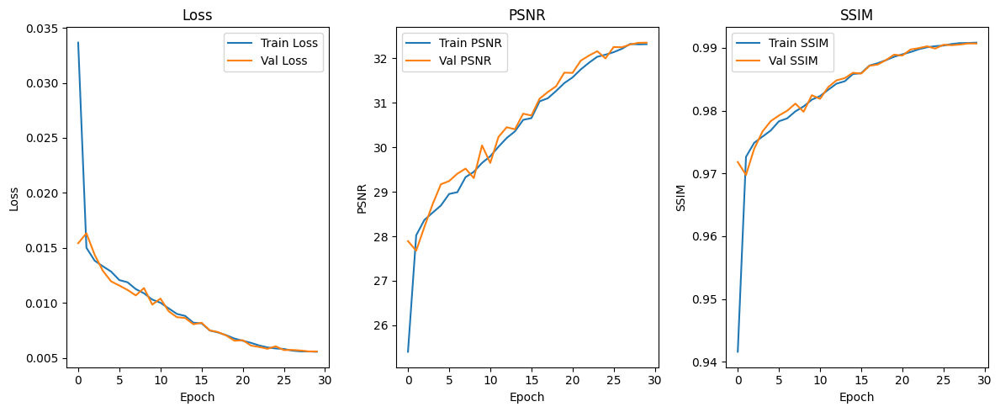

In [12]:
import matplotlib.pyplot as plt

# Compute averages
avg_train_loss = sum(train_history["loss"]) / NUM_EPOCHS
avg_val_loss = sum(val_history["loss"]) / NUM_EPOCHS
avg_train_psnr = sum(train_history["psnr"]) / NUM_EPOCHS
avg_val_psnr = sum(val_history["psnr"]) / NUM_EPOCHS
avg_train_ssim = sum(train_history["ssim"]) / NUM_EPOCHS
avg_val_ssim = sum(val_history["ssim"]) / NUM_EPOCHS

# Print average metrics
print(f"\nAverage Metrics Over {NUM_EPOCHS} Epochs:")
print(f"Train -> Loss: {avg_train_loss:.4f}, PSNR: {avg_train_psnr:.2f}, SSIM: {avg_train_ssim:.4f}")
print(f"Val   -> Loss: {avg_val_loss:.4f}, PSNR: {avg_val_psnr:.2f}, SSIM: {avg_val_ssim:.4f}")

# Plotting
plt.figure(figsize=(12, 5))
plt.subplot(1, 3, 1)
plt.plot(train_history["loss"], label="Train Loss")
plt.plot(val_history["loss"], label="Val Loss")
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(train_history["psnr"], label="Train PSNR")
plt.plot(val_history["psnr"], label="Val PSNR")
plt.title("PSNR")
plt.xlabel("Epoch")
plt.ylabel("PSNR")
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(train_history["ssim"], label="Train SSIM")
plt.plot(val_history["ssim"], label="Val SSIM")
plt.title("SSIM")
plt.xlabel("Epoch")
plt.ylabel("SSIM")
plt.legend()

plt.tight_layout()
plt.show()



Blur level: n_00


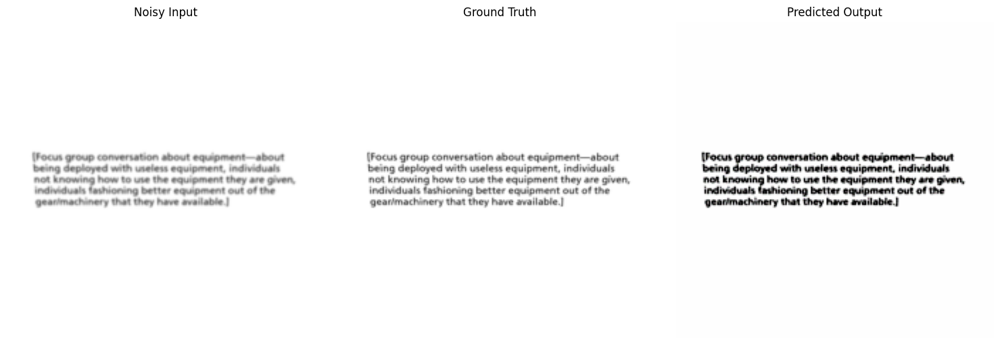

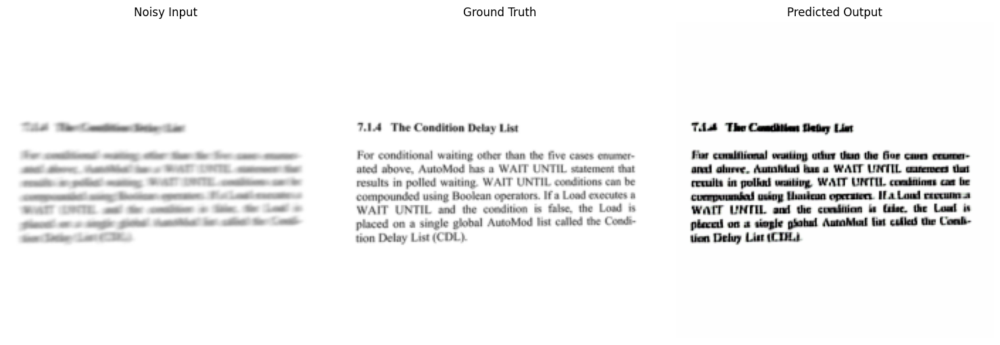

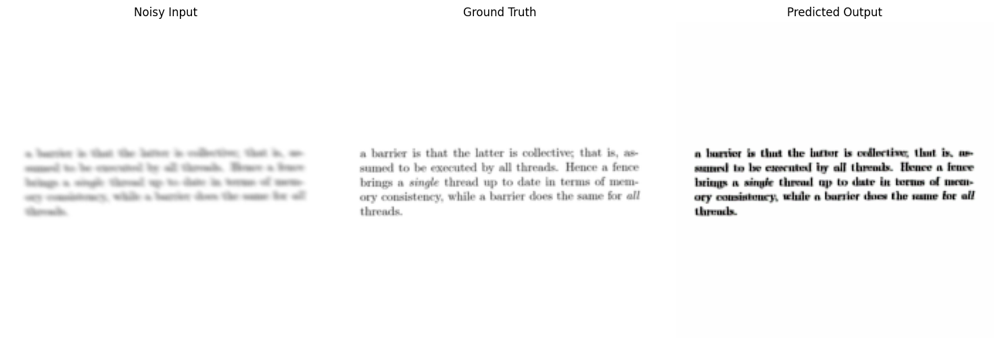


Blur level: n_01


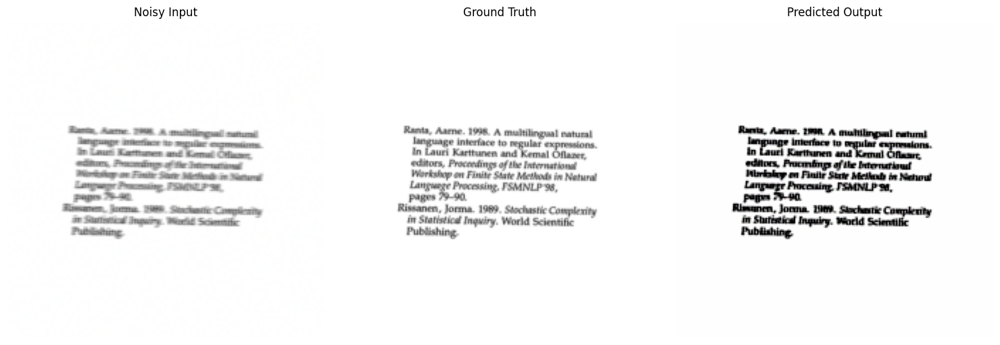

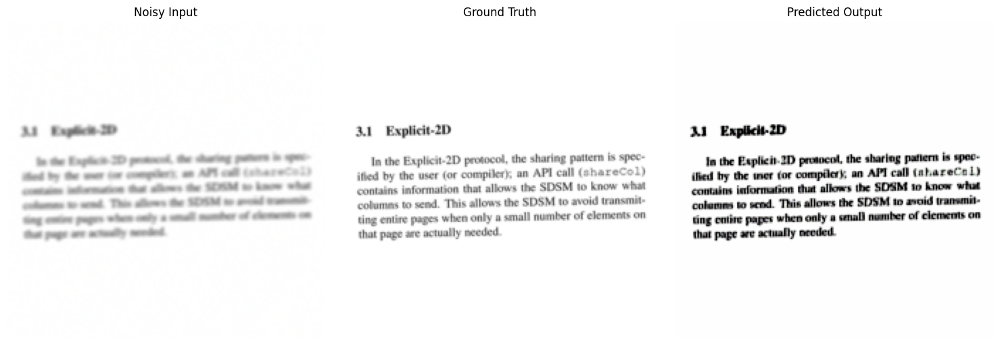

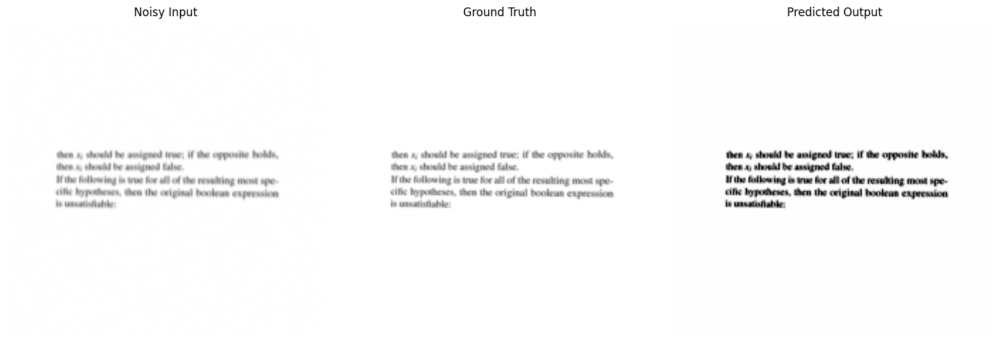


Blur level: n_02


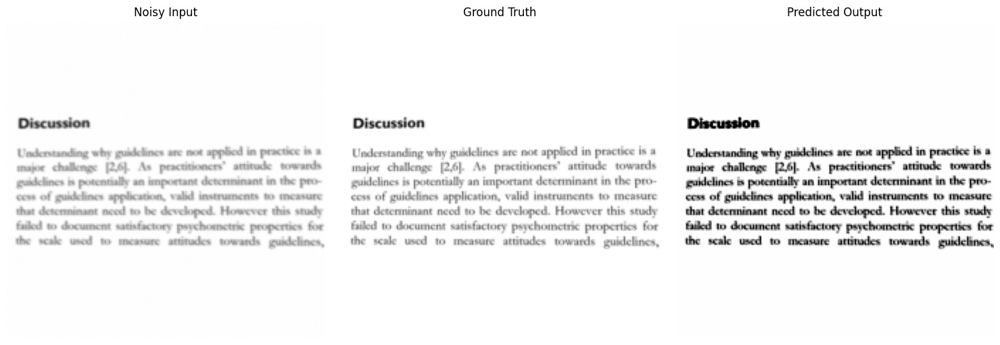

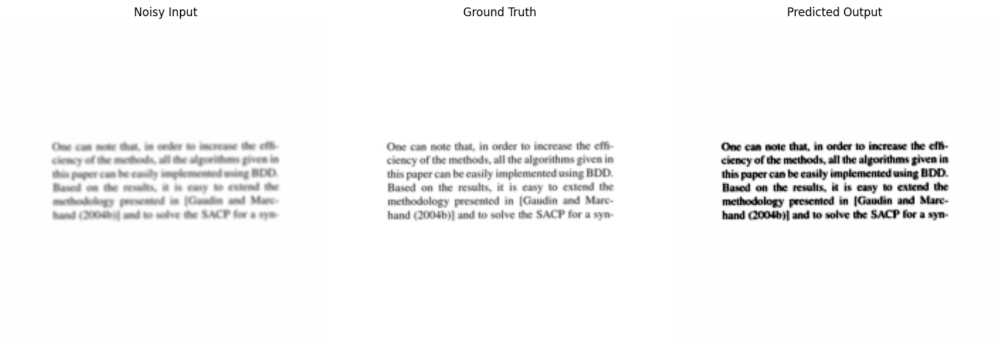

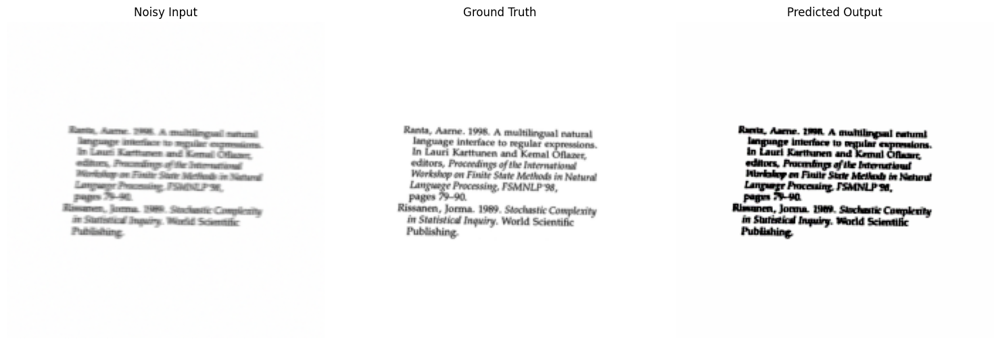


Blur level: n_03


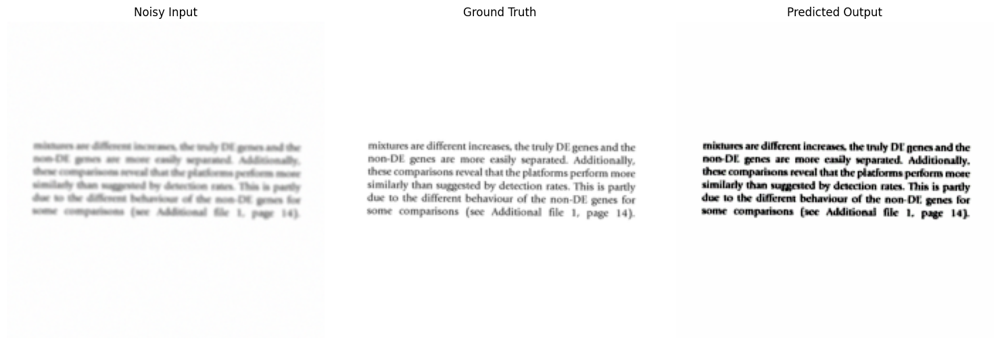

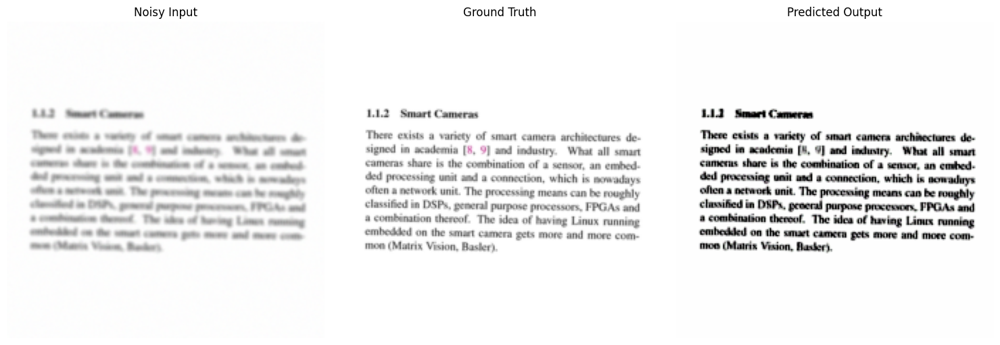

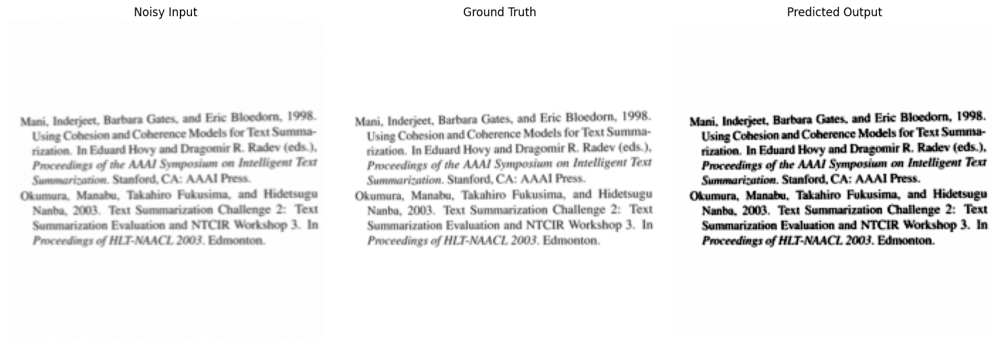


Blur level: n_04


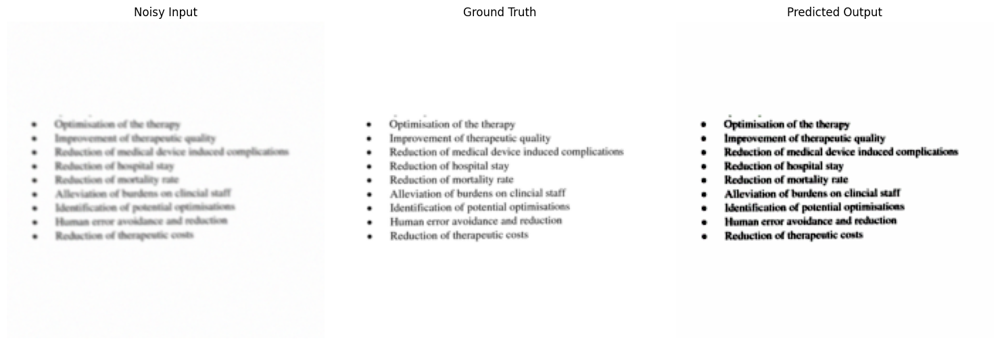

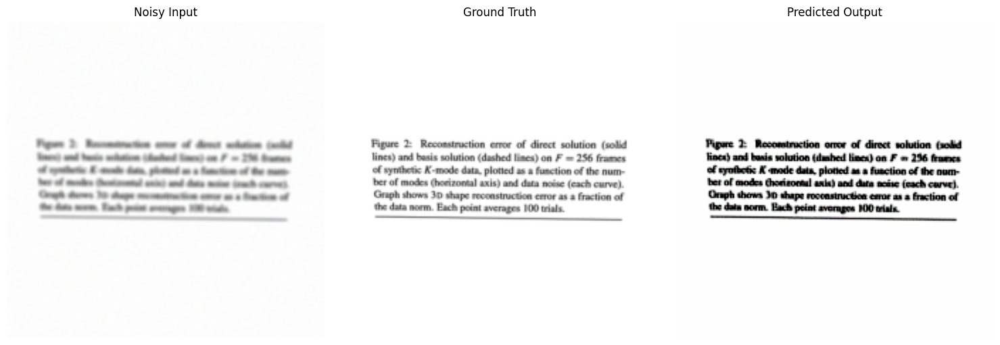

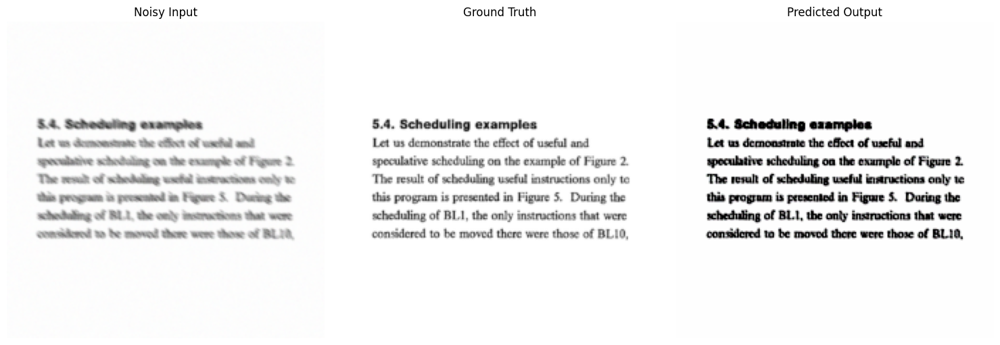


Blur level: n_05


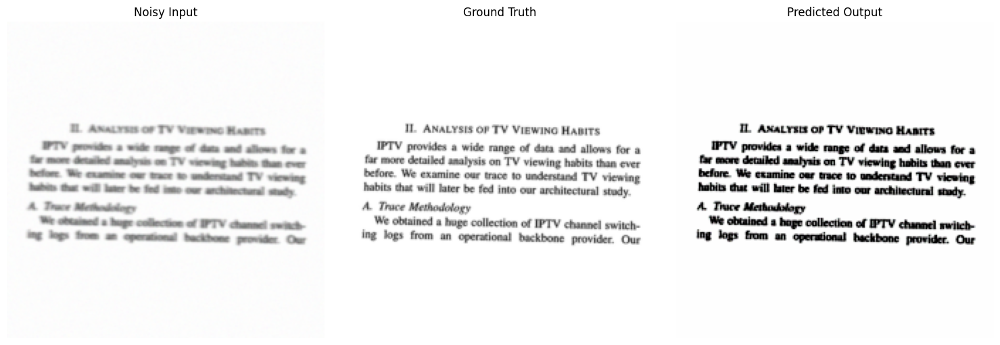

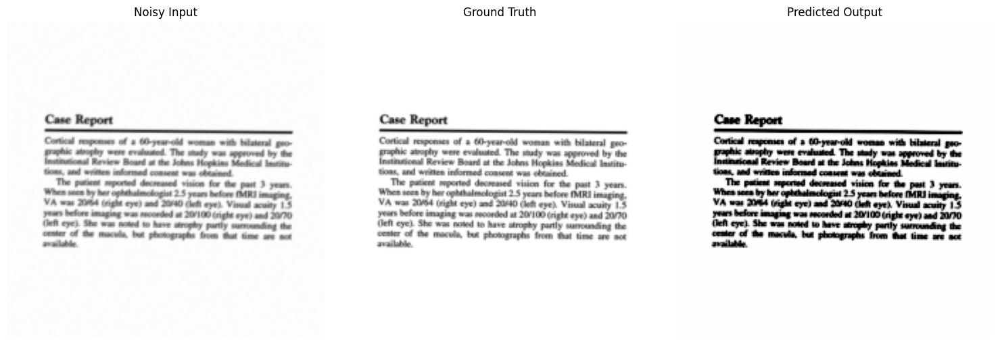

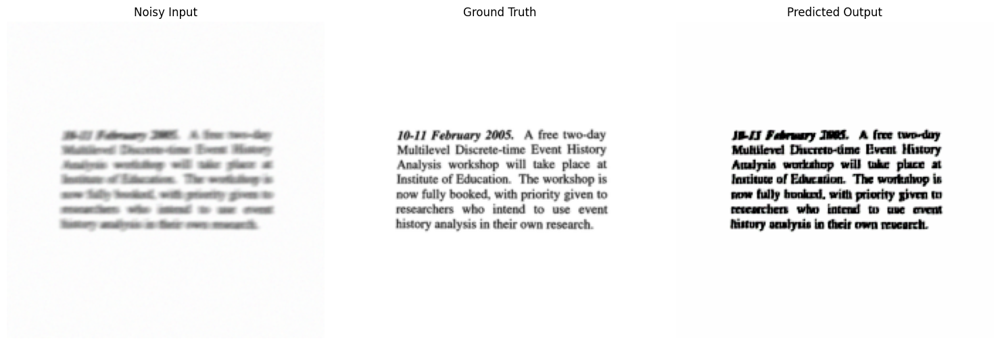


Blur level: n_06


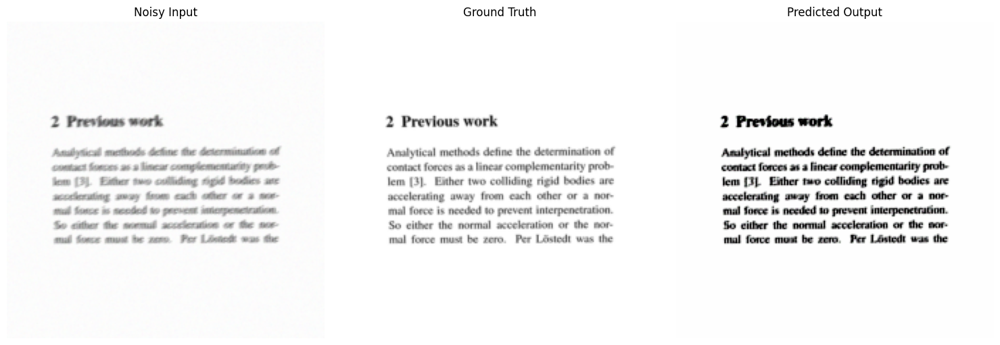

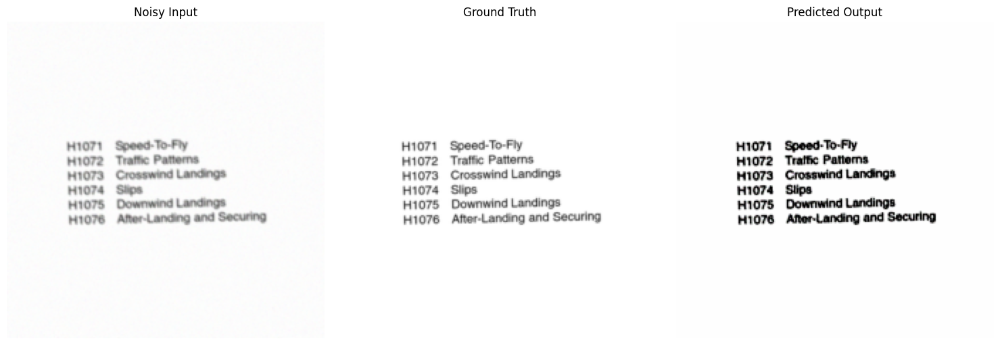

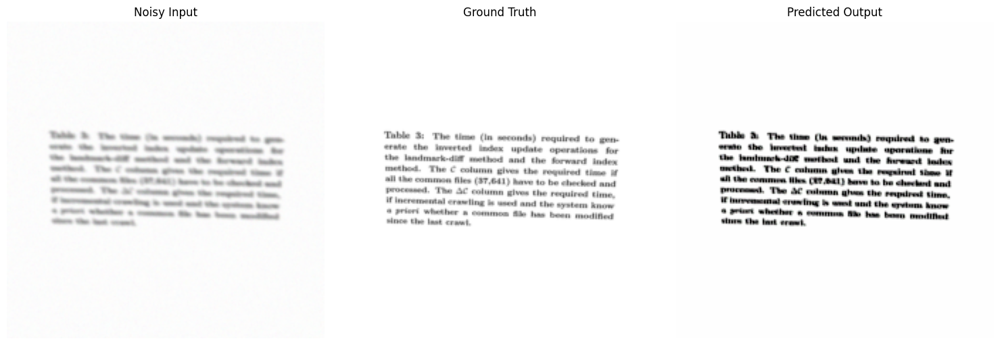


Blur level: n_07


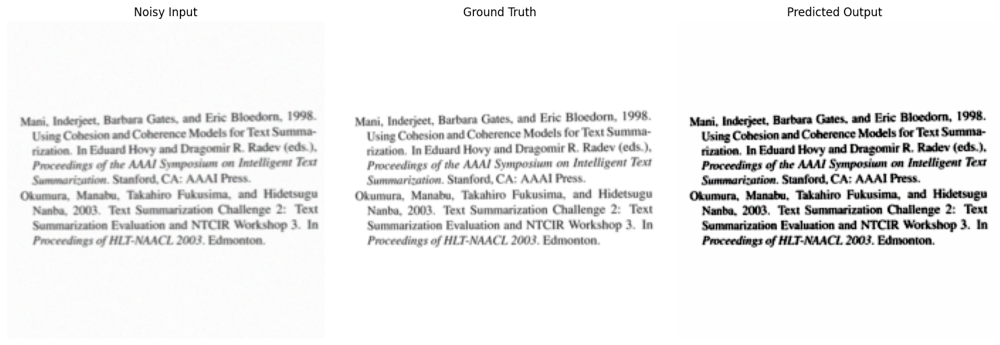

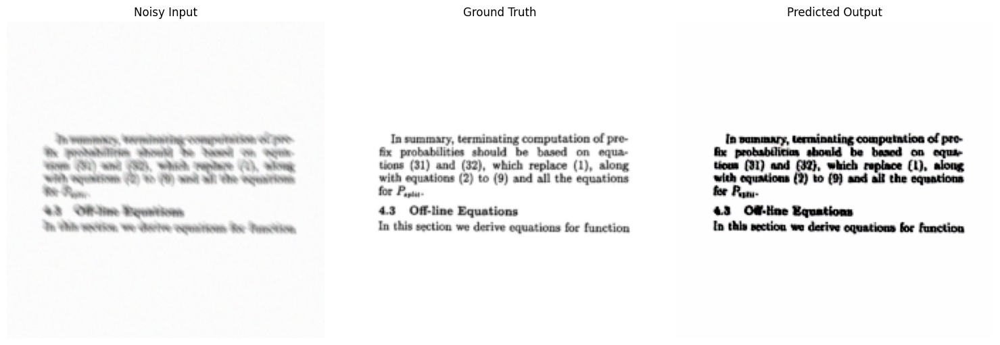

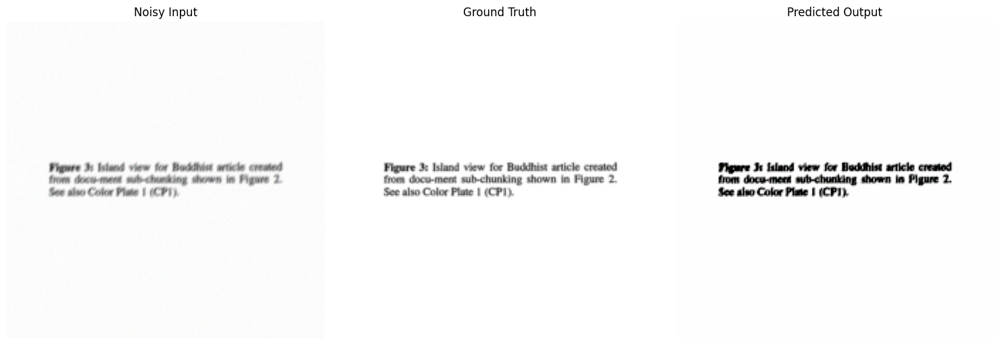


Blur level: n_08


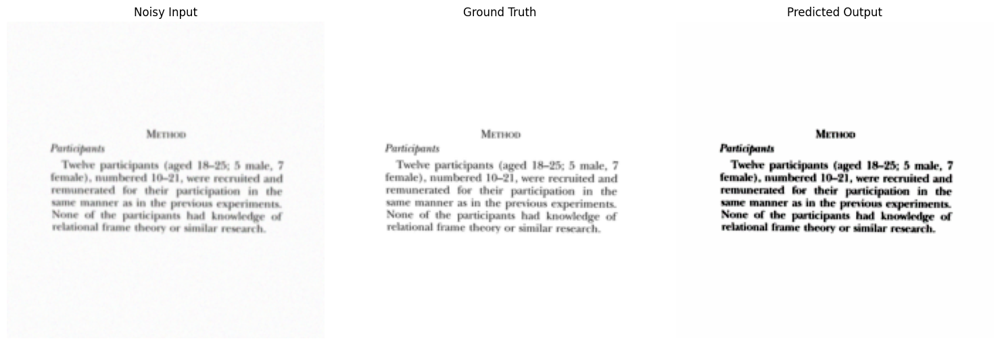

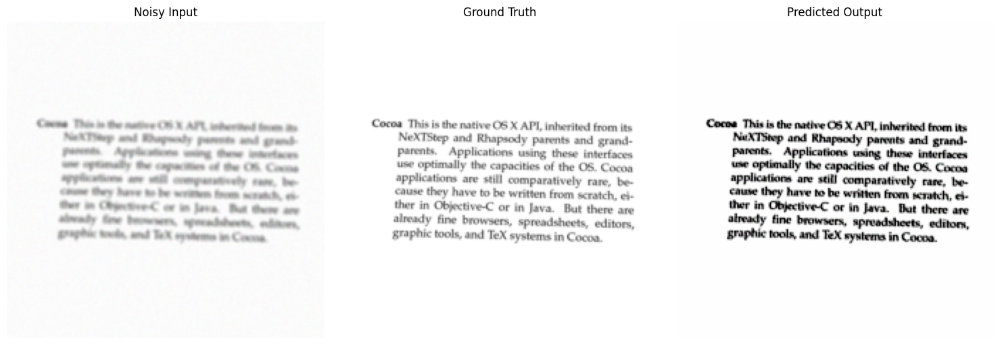

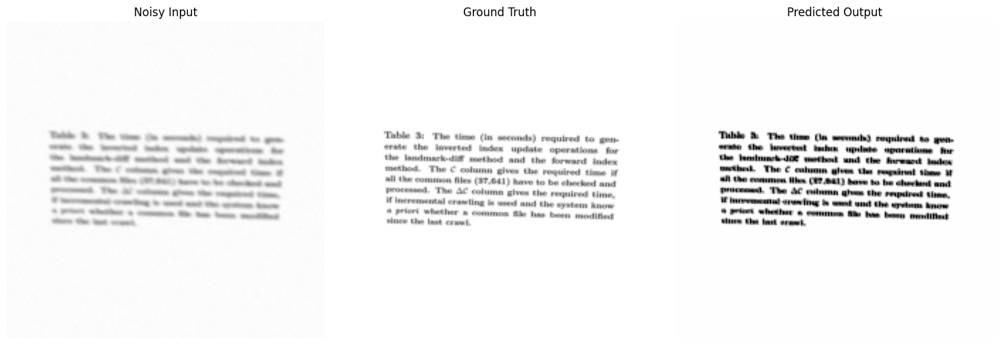


Blur level: n_09


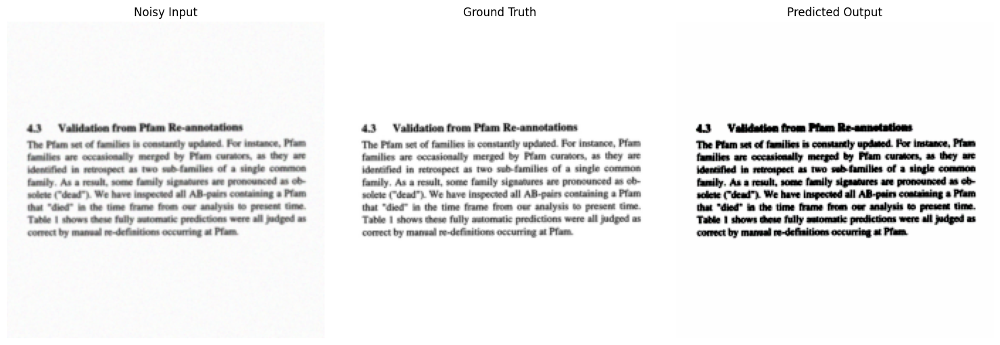

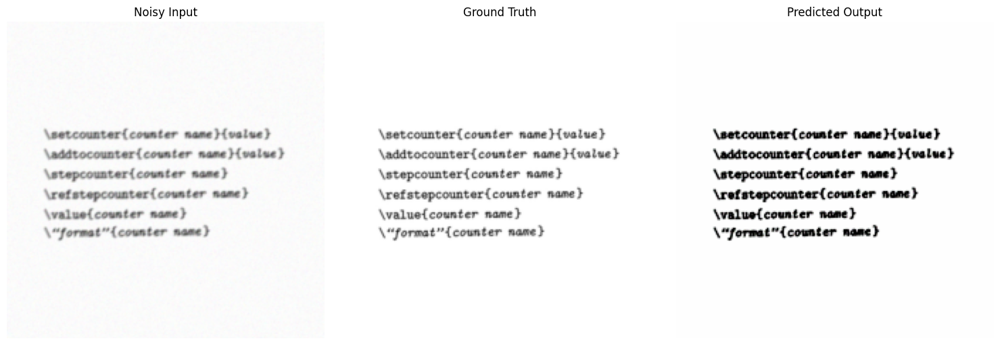

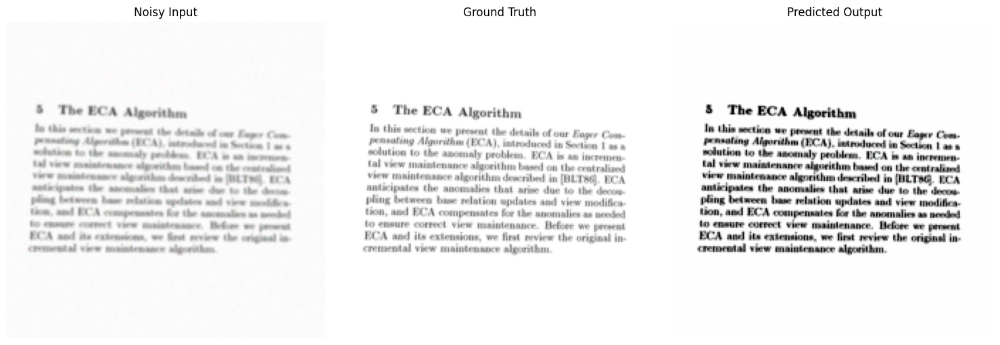


Blur level: n_10


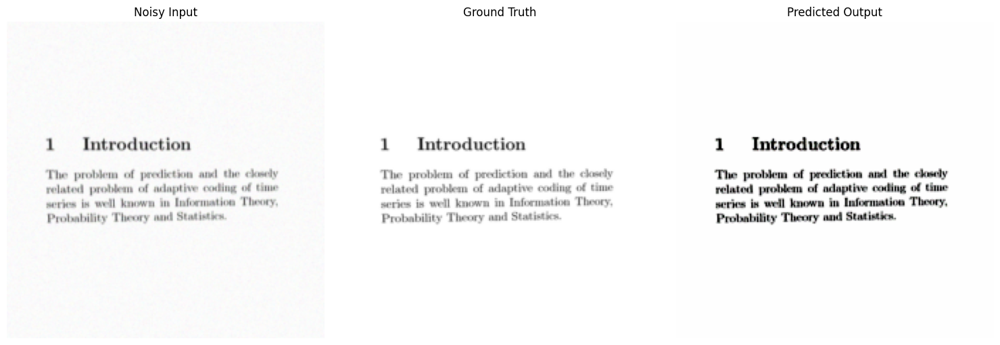

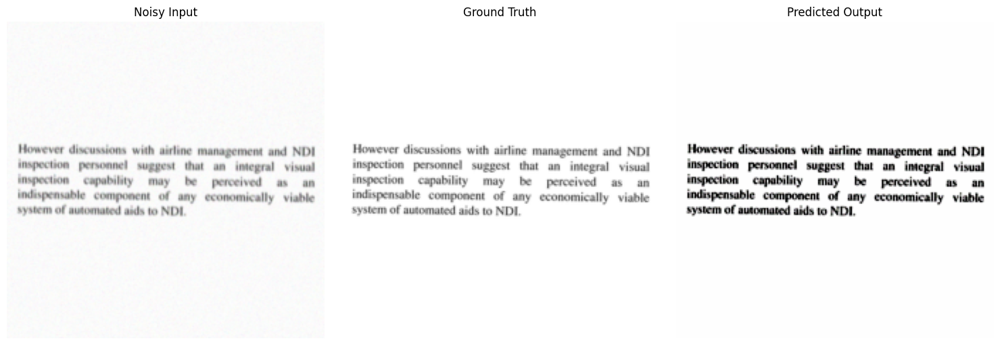

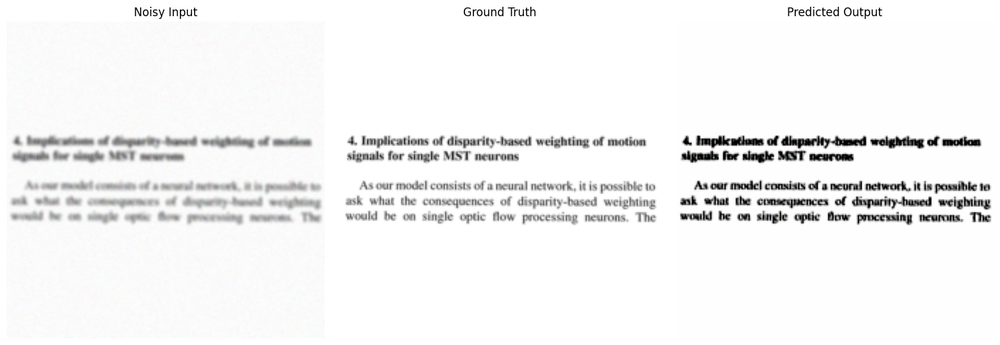

In [14]:
import os
import torch
import random
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms

model = DeepDeBlurCNN().to(device)
model.load_state_dict(torch.load("/kaggle/working/deblur_cnn_epoch30.pth", map_location=device,weights_only=True))  
model.eval()

transform_rgb = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])
transform_psf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

def denormalize(tensor):
    return tensor * 0.5 + 0.5

def show_predictions_from_each_blur_level(n_folders, root_path, max_images=3):
    for folder in n_folders:
        blur_path = os.path.join(root_path, folder)
        psf_path = os.path.join(root_path, "psf")
        orig_path = os.path.join(root_path, "orig")

        print(f"\nBlur level: {folder}")

        # Get all blur files and shuffle
        files = sorted([f for f in os.listdir(blur_path) if f.endswith("_blur.png")])
        random.shuffle(files)

        count = 0
        for file in files:
            base_name = file.replace("_blur.png", "")
            noisy_img_path = os.path.join(blur_path, file)
            psf_img_path = os.path.join(psf_path, f"{base_name}_psf.png")
            gt_img_path = os.path.join(orig_path, f"{base_name}_orig.png")

            if not (os.path.exists(psf_img_path) and os.path.exists(gt_img_path)):
                continue

            # Load and transform
            noisy_img = transform_rgb(Image.open(noisy_img_path).convert("RGB")).unsqueeze(0).to(device)
            psf_img = transform_psf(Image.open(psf_img_path).convert("L")).unsqueeze(0).to(device)
            gt_img = transform_rgb(Image.open(gt_img_path).convert("RGB")).unsqueeze(0).to(device)

            # Prepare input and predict
            input_tensor = torch.cat([noisy_img, psf_img], dim=1)
            with torch.no_grad():
                pred_img = model(input_tensor)

            noisy_img = denormalize(noisy_img.squeeze(0).cpu()).permute(1, 2, 0).numpy()
            gt_img = denormalize(gt_img.squeeze(0).cpu()).permute(1, 2, 0).numpy()
            pred_img = pred_img.squeeze(0).cpu().permute(1, 2, 0).numpy()

            fig, axs = plt.subplots(1, 3, figsize=(15, 5))
            axs[0].imshow(noisy_img)
            axs[0].set_title("Noisy Input")
            axs[1].imshow(gt_img)
            axs[1].set_title("Ground Truth")
            axs[2].imshow(pred_img)
            axs[2].set_title("Predicted Output")

            for ax in axs:
                ax.axis("off")
            plt.tight_layout()
            plt.show()

            count += 1
            if count >= max_images:
                break

blur_folders = [f"n_{str(i).zfill(2)}" for i in range(11)]  # n_00 to n_10
show_predictions_from_each_blur_level(blur_folders, DATA_PATH, max_images=3)

In [15]:
# Load the best saved model weights
model.load_state_dict(torch.load(SAVE_PATH, map_location=device))
model.eval()

# Initialize accumulators for final validation metrics
final_val_loss, final_val_psnr, final_val_ssim = 0, 0, 0

with torch.no_grad():
    for noisy, clean, psf in val_loader:
        noisy, clean, psf = noisy.to(device), clean.to(device), psf.to(device)
        inputs = torch.cat([noisy, psf], dim=1)

        outputs = model(inputs)
        loss = criterion(outputs, clean)

        final_val_loss += loss.item()
        final_val_psnr += psnr_metric(outputs, clean).item()
        final_val_ssim += ssim_metric(outputs, clean).item()

num_val_batches = len(val_loader)
final_val_loss /= num_val_batches
final_val_psnr /= num_val_batches
final_val_ssim /= num_val_batches

print(f"\nFinal Validation Metrics after training completion:")
print(f"Loss: {final_val_loss:.4f}")
print(f"PSNR: {final_val_psnr:.2f}")
print(f"SSIM: {final_val_ssim:.4f}")

final_val_loss, final_val_psnr, final_val_ssim

/tmp/ipykernel_31/439767111.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(SAVE_PATH, map_location=device))



Final Validation Metrics after training completion:
Loss: 0.0056
PSNR: 32.35
SSIM: 0.9907


(0.005584060680121183, 32.35446284367488, 0.9906952839631301)

In [12]:
import torch

# --- 1. recreate model and load saved weights ---
saved_path = "/kaggle/input/original_model/pytorch/deblur_cnn_epoch30.pth/1/deblur_cnn_epoch30.pth"

model = DeepDeBlurCNN().to(device)
model.load_state_dict(torch.load(saved_path, map_location=device))
model.eval()

print(f"Loaded model from: {saved_path}")

# --- 2. evaluation function ---
def evaluate_model(loader, split_name="Data"):
    total_loss, total_psnr, total_ssim = 0.0, 0.0, 0.0
    num_batches = len(loader)

    with torch.no_grad():
        for noisy, clean, psf in loader:
            noisy, clean, psf = noisy.to(device), clean.to(device), psf.to(device)
            inputs = torch.cat([noisy, psf], dim=1)

            outputs = model(inputs)
            loss = criterion(outputs, clean)

            total_loss += loss.item()
            total_psnr += psnr_metric(outputs, clean).item()
            total_ssim += ssim_metric(outputs, clean).item()

    avg_loss = total_loss / num_batches
    avg_psnr = total_psnr / num_batches
    avg_ssim = total_ssim / num_batches
    print(f"{split_name} -> Loss: {avg_loss:.4f}, PSNR: {avg_psnr:.2f}, SSIM: {avg_ssim:.4f}")
    return avg_loss, avg_psnr, avg_ssim

# --- 3. run evaluation on train and validation sets ---
train_loss, train_psnr, train_ssim = evaluate_model(train_loader, "Train")
val_loss, val_psnr, val_ssim = evaluate_model(val_loader, "Validation")


/tmp/ipykernel_31/1131006057.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(saved_path, map_location=device))


Loaded model from: /kaggle/input/original_model/pytorch/deblur_cnn_epoch30.pth/1/deblur_cnn_epoch30.pth
Train -> Loss: 0.0053, PSNR: 32.57, SSIM: 0.9912
Validation -> Loss: 0.0054, PSNR: 32.46, SSIM: 0.9909
